<a href="https://colab.research.google.com/github/r-parkinson/r-parkinson/blob/main/Assignment_2_2C_The_Maze.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Assignment 2.2C**

Solving the maze highlighting different methods of exploration/exploration.



Load the packages


In [ ]:
# install required system dependencies
!apt-get install -y xvfb x11-utils  
!apt-get install x11-utils > /dev/null 2>&1
!pip install PyOpenGL==3.1.* \
            PyOpenGL-accelerate==3.1.* \
            gym[box2d]==0.17.* 
!pip install pyglet
!pip install ffmpeg
! pip install pyvirtualdisplay
!pip install Image
!pip install gym-maze-trustycoder83

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libxxf86dga1
Suggested packages:
  mesa-utils
The following NEW packages will be installed:
  libxxf86dga1 x11-utils xvfb
0 upgraded, 3 newly installed, 0 to remove and 30 not upgraded.
Need to get 993 kB of archives.
After this operation, 2,981 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libxxf86dga1 amd64 2:1.1.4-1 [13.7 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 x11-utils amd64 7.7+3build1 [196 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 xvfb amd64 2:1.19.6-1ubuntu4.8 [784 kB]
Fetched 993 kB in 2s (512 kB/s)
Selecting previously unselected package libxxf86dga1:amd64.
(Reading database ... 160980 files and directories currently installed.)
Preparing to unpack .../libxxf86dga1_2%3a1.1.4-1_amd64.deb ...
Unpacking libxxf86dga1:amd64 (2:1.

Function to Setup the Maze and the Maze solving

In [ ]:
# import packages
import pandas as pd
import sys
import numpy as np
import gym
import gym_maze
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os
import shutil
from IPython.display import display as dis
from pyvirtualdisplay import Display
from gym.wrappers.monitoring import video_recorder

# check if video direcoty exists if not create
if not os.path.isdir('vid'): os.mkdir('vid')
# if does exist and has files, delete the directory and re-create
elif os.listdir ('vid'): shutil.rmtree('vid') ; os.mkdir('vid') 

# Setup the function
def dtm(opt,ep,gam,fn,pqtab,giex, decf):
  d = Display()
  d.start()
  
  # Recording filename
  
  video_name = str("./vid/"+fn+"A2.mp4")

  # Setup the environment for the maze
  env = gym.make("maze-sample-10x10-v0")

  # Setup the video
  vid = None
  vid = video_recorder.VideoRecorder(env,video_name)

  # env = gym.wrappers.Monitor(env,'./vid',force=True)
  cs = env.reset()

  # setup the q table with x and y qvalues and maze table for inteligent exploration
  qt = pd.DataFrame(np.zeros((100,10)),columns = ['x','y','u','d','l','r','mu','md','ml','mr'])
  for x in range(10):
    for y in range(10):
      i = int('{}{}'.format(x, y))
      # print(i,x,y)
      qt.iloc[i,0] = x
      qt.iloc[i,1] = y
  
  # setup maze table for more inteligent exploring 
  qt.iloc[:,6:10] = True    

  if opt != 0:
    qt.iloc[:,2:6] = opt
    op = "Optimistic Init " + str(opt)
  else:
    op = "Realistic Init "  
  # print(qt)  

  # total number of episodes
  toeps = 500

  # steps per episode
  spep = 200

  # epsilon value
  # ep = 0.1 initilised by function
  if ep == 0:
    gre = " Greedy E= 0 "
  else:
    gre = "E-Greedy e= " + str(ep) 

  # discount 
  # gam = 1 initilised by function
  

  # learning rate .. as this is a stationary task in that the probaility does not change for each decision
  #  i have left the learing rate at 1/iteration as recomended for stationay tasks I did modify this to a fix number the the maze failed to converge.
  


  # Working Specific setup
  # total average rewards
  tavrew = []
  # rewards per episode
  rewpe = []
  # Previous state
  prevst = [0,0]
  # Previouse action
  oact = 0
  # initilize availiable actions
  avact = [0]
  
  # Mail loop
  for i in range(toeps):

    # set done to fase
    d = False
    # set reards per episode 
    repe = 0
    csall = []
    actall = []
    
    # select action based on epsilom probability or based on q_table 
    if decf != 0:
      if ep > 0:
        ep = ep-decf # linear reduction
        #print ("\n E =",ep)

    # start the maze episode
    for j in range(spep):
      # standard video setup visulisation setup
      env.unwrapped.render()
      vid.capture_frame()

      # get start position from env
      cucx = int(cs[0])
      cucy = int(cs[1])
         
      cuqtc = int(qt.index[(qt["x"] == cucx) & (qt['y'] == cucy)].to_list()[0])
          
          
      if np.random.uniform(0,1) < ep:
        act = env.action_space.sample()
        if giex == 'ge': # Effeicient exploation actions is enabled
          # check action if it will hit the wall.
          if not qt.iloc[cuqtc, act+6]: # no point exploring there its a wall.
            avact = np.extract((qt.iloc[cuqtc,6:10].to_numpy()),(np.array([0,1,2,3])))
            act =  int (np.random.choice(avact) )

          if oact == 0 and act == 1:  # going back on itself
            if len(avact) == 1: act = 1 # has to go back because there is no alternative
            else: # pick a different option to going back 
              nacdom = np.delete(avact, [act])
              act = int (np.random.choice(nacdom))

          if oact == 1 and act == 0:  # going back on itself
            if len(avact) == 1: act = 0  # has to go back because there is no alternative
            else: # pick a different option to going back 
              nacdom = np.delete(avact, [act])
              act = int (np.random.choice(nacdom))

          if oact == 2 and act == 3:  # going back on itself
            if len(avact) == 1: act = 3# has to go back because there is no alternative
            else: # pick a different option to going back 
              nacdom = np.delete(avact, [act])
              act = int (np.random.choice(nacdom))

          if oact == 3 and act == 2:  # going back on itself
            if len(avact) == 1: act = 2 # has to go back because there is no alternative
            else: # pick a different option to going back 
              nacdom = np.delete(avact, [act])
              act = int (np.random.choice(nacdom))
              

      else:
        act = int(np.argmax(qt.iloc[cuqtc,2:6]))
        
      
      # take the next step
      ns, rew, d, _ = env.step(act)

      # break out next state into x and y coodinates
      nxc = int(ns[0])     
      nyc = int(ns[1])   

      # check if move hit the wall
      if ns[0] == cucx and  ns[1] == cucy:
                
        qt.iloc[ cuqtc, act+6 ] = False
        # add a penalty for hitting the wall the default penalty is -0.1/number of states which in our case is 100 equaling -0.001
        rew = -0.1
        # we have added 100 times more penalty if the action hits a wall. esentailly adding memory of action hitting the wall.

      # add penaitly for going back to a state that has aleady been to.
      if prevst[0] == ns[0] and prevst[1] == ns[1]:
        
        rew = -0.01
      
      # update the q table, j has +1 as j starts at 0
      qt.iloc[cuqtc, act+2 ] = qt.iloc[cuqtc, act+2 ] + 1/(j+1)*(rew - (gam * qt.iloc[cuqtc, act+2 ]))
      if pqtab == "pqt" : pd.set_option('display.max_rows', None,'display.max_columns', None) ; dis(qt)
      
      # add the rewards
      repe += rew
      
      # If the episode is finished, we leave the for loop
      if d:
          break
      # move to new state
      cs = ns

      # record previous state
      prevst = cucx, cucy
      act = oact 
      
    #Show the total episode reward        
    #print("Qtable\n", qt)
    #print("Total episode reward:", repe)
    #print("Total steps:", j )    
    #print("episode number",i)
    #Reset enviroment for next episode
    cs = env.reset()
    print ('\rEpisode',i,'Epoc',j,end='')

    rewpe.append(repe)
    # Save video episode and close
    tavrew.append( repe/(j+1))
  #print('\n next')
  #print(tavrew)
  #print("Video successfuly saved.")
  vid.close()
  vid.enabled = False   

  cm = ['tab:orange','tab:blue','tab:green', 'tab:red', 'tab:purple']
  plt.plot(range(toeps),tavrew,color = np.random.choice(cm)) 
  plt.title(op+gre+" Discount Rate = "+str(gam))
  plt.ylabel('Toltal average Reward')
  plt.xlabel('Episode')
  plt.show()

  if not fn == "":
        
    import base64
    import io
    from IPython import display
    


    video_name = str("./vid/"+fn+"A2.mp4")

    video = io.open(video_name, 'r+b').read()
    encoded = base64.b64encode(video)

    display.display(display.HTML(data="""
      <video alt="test" controls>
      <source src="data:video/mp4;base64,{0}" type="video/mp4" />
      </video>
      """.format(encoded.decode('ascii'))))
    
  return (tavrew,qt)

# Run The Maze get the results

pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html
Episode 499 Epoc 27 


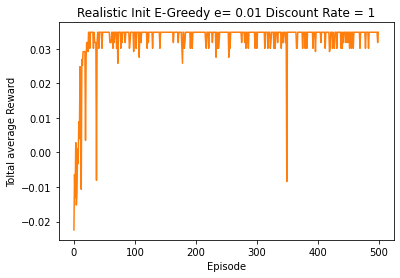

Episode 499 Epoc 199 


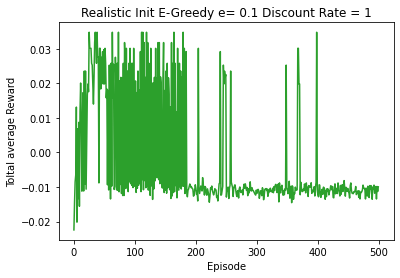

Episode 499 Epoc 31 


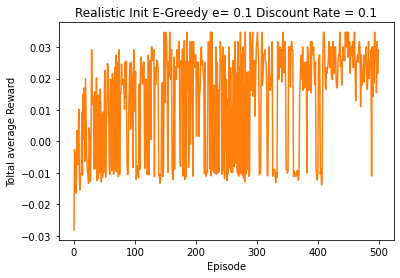

Episode 499 Epoc 199 


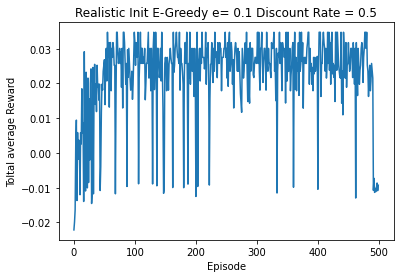

Episode 499 Epoc 199 


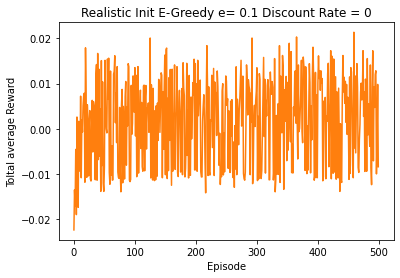

Episode 499 Epoc 27 


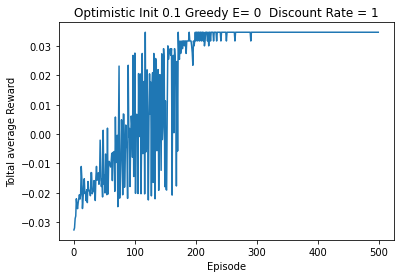

Episode 499 Epoc 35 


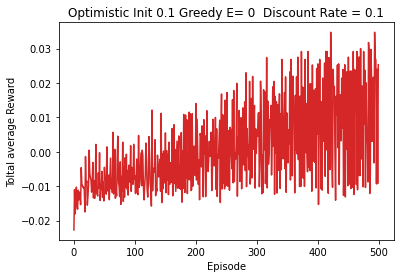

Episode 499 Epoc 27 


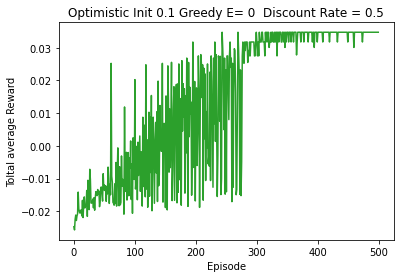

Episode 499 Epoc 27 


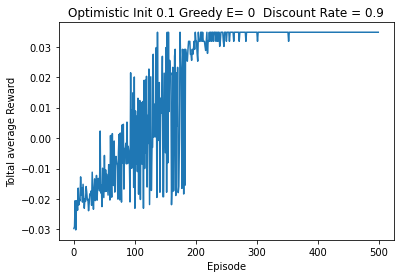

Episode 499 Epoc 77 


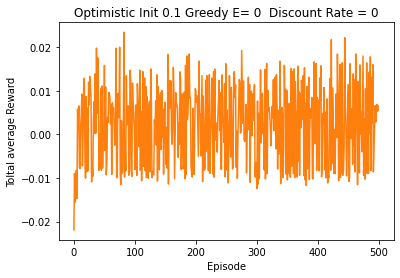

Episode 499 Epoc 40 


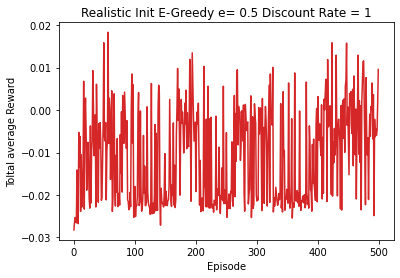

Episode 499 Epoc 199 


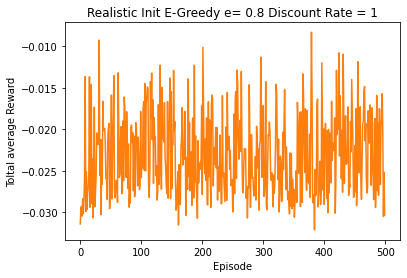

([-0.03141999999999996,
  -0.029439999999999963,
  -0.029304999999999946,
  -0.03047499999999996,
  -0.02835999999999995,
  -0.030204999999999947,
  -0.02849499999999997,
  -0.025749999999999957,
  -0.013637362637362604,
  -0.029934999999999976,
  -0.025119999999999938,
  -0.029664999999999945,
  -0.027729999999999953,
  -0.02696499999999995,
  -0.025209999999999944,
  -0.013651515151515135,
  -0.029394999999999966,
  -0.02633499999999994,
  -0.014574468085106365,
  -0.02898999999999996,
  -0.023591954022988477,
  -0.030699999999999953,
  -0.027144999999999954,
  -0.017339130434782576,
  -0.02934999999999996,
  -0.027369999999999974,
  -0.02552499999999994,
  -0.020441176470588185,
  -0.020570422535211203,
  -0.021853503184713338,
  -0.020670967741935414,
  -0.009241935483870953,
  -0.025569999999999937,
  -0.021285714285714234,
  -0.03029499999999996,
  -0.021276243093922627,
  -0.026649999999999948,
  -0.01660799999999996,
  -0.02008536585365848,
  -0.020193277310924334,
  -0.0198988

In [ ]:
#  !!! Fixed Total Episode lenght 500
#  !!! Fixed Epocs per Episode 200
# optimistic Init value, 0 for realistic Init
# E = epsilom (e-greedy value)
# discount rate 
# video filename for video, "" for no video
# "pqt" to print the qtable, "" for no Q table
# 'ge' for inteligent exploration, "" for more random exploration 
# Linear decay rate else 0 for no decay

# realistic optimisation E-Greedy 0.01 with discount rate of 1 (no discount)
out = dtm(0, 0.01, 1 ,"","","",0)
# realistic optimisation E-Greedy 0.1 with discount rate of 1 (no discount)
out = dtm(0, 0.1, 1 ,"","","",0)
# same with discount rate of 0.1
out = dtm(0, 0.1, 0.1 ,"","","",0)
# same with discount rate of 0.5
out = dtm(0, 0.1, 0.5 ,"","","",0)
# sane with discount rate of 0
out = dtm(0, 0.1, 0 ,"","","",0)
# optisitic oprimisation E-Greed 0 with discount rate of 1 (no discount)
out = dtm(0.1 ,0 , 1 , "","","",0)
# same with discount .1 
out = dtm(0.1 ,0, .1 ,"","","",0)
# same with discount .5 
out = dtm(0.1 ,0, .5 ,"","","",0)
# same with discount .9
out = dtm(0.1 ,0, .9 ,"","","",0) 
# same with discount 0
out = dtm(0.1 ,0, 0 ,"","","",0)
# realistic optimisation E-Greedy 0.5 with discount rate of 1
out = dtm(0, 0.5, 1 ,"","","",0) 
# realistic optimisation E-Greedy 0.8 with discount rate of 1
out = dtm(0, 0.8, 1 ,"","","",0) 



# Variants on solving mechanism

Episode 499 Epoc 199 


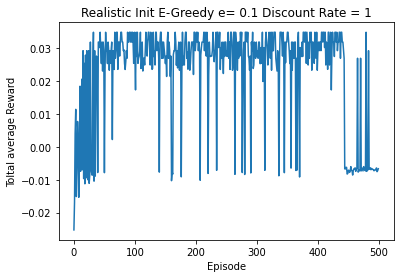

In [ ]:
#  !!! Fixed Total Episode lenght 500
#  !!! Fixed Epocs per Episode 200
# optimistic Init value, 0 for realistic Init
# E = epsilom (e-greedy value)
# discount rate 
# video filename for video, "" for no video
# "pqt" to print the qtable, "" for no Q table
# 'ge' for inteligent exploration, "" for more random exploration 
# Linear decay rate else 0 for no decay


out = dtm(0, 0.1, 1 ,"","","ge",0)
tarepe, qt = out


Episode 499 Epoc 85

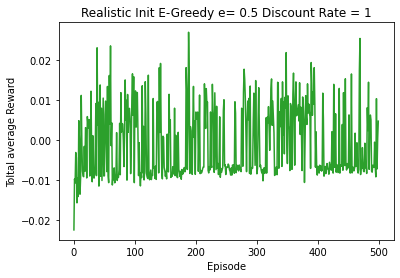

In [ ]:
#  !!! Fixed Total Episode lenght 500
#  !!! Fixed Epocs per Episode 200
# optimistic Init value, 0 for realistic Init
# E = epsilom (e-greedy value)
# discount rate 
# video filename for video, "" for no video
# "pqt" to print the qtable, "" for no Q table
# 'ge' for inteligent exploration, "" for more random exploration 
# Linear decay rate else 0 for no decay


out = dtm(0, 0.5, 1 ,"","vid2","ge",0)


pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html
Episode 499 Epoc 27 


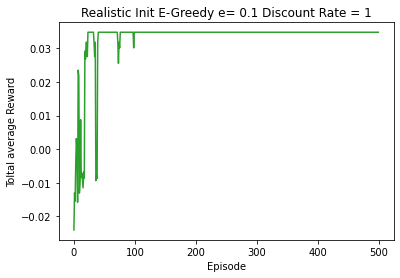

In [ ]:
#  !!! Fixed Total Episode lenght 500
#  !!! Fixed Epocs per Episode 200
# optimistic Init value, 0 for realistic Init
# E = epsilom (e-greedy value)
# discount rate 
# video filename for video, "" for no video
# "pqt" to print the qtable, "" for no Q table
# 'ge' for inteligent exploration, "" for more random exploration 
# Linear decay rate else 0 for no decay


out = dtm(0, 0.1 , 1 ,"vid1","","", 0.004 )

Episode 499 Epoc 27 


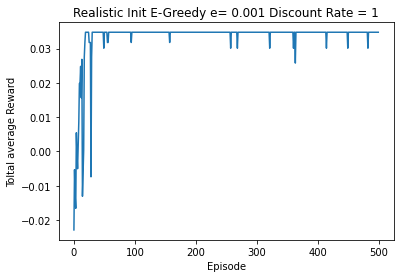

In [ ]:
#  !!! Fixed Total Episode lenght 500
#  !!! Fixed Epocs per Episode 200
# optimistic Init value, 0 for realistic Init
# E = epsilom (e-greedy value)
# discount rate 
# video filename for video, "" for no video
# "pqt" to print the qtable, "" for no Q table
# 'ge' for inteligent exploration, "" for more random exploration 
# Linear decay rate else 0 for no decay


out = dtm(0, 0.001, 1 ,"","","",0)


Episode 499 Epoc 199

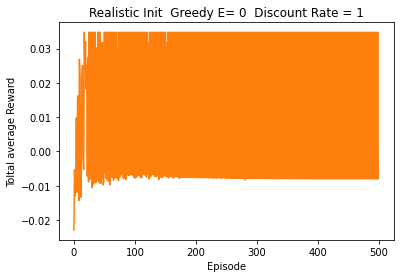

In [ ]:
#  !!! Fixed Total Episode lenght 500
#  !!! Fixed Epocs per Episode 200
# optimistic Init value, 0 for realistic Init
# E = epsilom (e-greedy value)
# discount rate 
# video filename for video, "" for no video
# "pqt" to print the qtable, "" for no Q table
# 'ge' for inteligent exploration, "" for more random exploration 
# Linear decay rate else 0 for no decay


out = dtm(0, 0, 1 ,"","","",0)
